EDA (탐색적 데이터 분석)

In [0]:
files = dbutils.fs.ls("/mnt/my-mount")
print(files)

[FileInfo(path='dbfs:/mnt/my-mount/FDS_Dataset.JPG', name='FDS_Dataset.JPG', size=231190, modificationTime=1744691025000), FileInfo(path='dbfs:/mnt/my-mount/fraud_detection_dataset_with_full_columns.csv', name='fraud_detection_dataset_with_full_columns.csv', size=39891173, modificationTime=1745382516000), FileInfo(path='dbfs:/mnt/my-mount/synthetic_transaction_data.csv', name='synthetic_transaction_data.csv', size=116321723, modificationTime=1746086547000)]


In [0]:
fds_sdf = spark.read.csv("dbfs:/mnt/my-mount/synthetic_transaction_data.csv", header=True, inferSchema=True)
fds_sdf.display() 


transaction_time,TransactionDT,recipient,TransactionAmt,hour,voice_match,DeviceInfo,region,receiver_bank,receiver_account,is_new_account_for_user,avg_amount_to_bank,amount_ratio_to_bank_avg,is_nighttime,recent_transaction_gap,is_new_device,ip_address,vpn,payment_method,intent,authentication,app_version,rooting
2025-01-14T09:56:23Z,86400,춘자,68500.0,9,true,Unknown,대구,토스뱅크,1000000266274,false,481616,0.14222949403674295,0,14.932585256706236,false,58.232.2.170,false,P04,2025-05-01T05:00:00Z,A06,3.1.0,false
2025-04-20T22:42:41Z,86401,수빈,29000.0,22,false,Unknown,대구,카카오뱅크,1000000573349,true,79943,0.3627584654066022,0,21.894439153735185,false,25.0.3.185,false,P05,2025-05-01T02:00:00Z,A02,3.4.3,false
2025-04-09T19:27:13Z,86469,서준,59000.0,19,true,Unknown,부산,신한은행,1000000451208,false,218283,0.27029131906744913,0,17.249458781701744,false,168.188.65.132,true,P01,2025-05-01T05:00:00Z,A06,1.2.1,true
2025-01-30T01:26:54Z,86499,병철,50000.0,1,true,Unknown,부산,카카오뱅크,1000000473588,false,457390,0.1093159010909727,1,12.112010924878504,true,158.221.28.126,true,P05,2025-05-01T05:00:00Z,A02,3.8.1,true
2025-01-24T22:58:30Z,86506,민수,50000.0,22,true,SAMSUNG SM-G892A Build/NRD90M,서울,우리은행,1000000040287,false,289443,0.1727455837591512,0,75.83457443942211,true,171.223.101.73,true,P04,2025-05-01T02:00:00Z,A02,3.6.0,true
2025-04-02T07:37:44Z,86510,병철,49000.0,7,false,Unknown,속초,토스뱅크,1000000587467,false,146229,0.33509085065205946,0,357.2275102425947,false,57.164.9.211,false,P05,2025-05-01T01:00:00Z,A02,1.1.3,false
2025-03-18T10:56:38Z,86522,지민,159000.0,10,true,Unknown,부산,우리은행,1000000202121,true,459799,0.34580327490925383,0,143.24940848206558,false,112.93.76.173,false,P04,2025-05-01T03:00:00Z,A04,1.8.9,false
2025-03-24T18:00:44Z,86529,아름,422500.0,18,true,Unknown,부산,신한은행,1000000167090,false,463300,0.9119361105115475,0,123.63003230672872,true,154.97.152.8,true,P06,2025-05-01T04:00:00Z,A02,1.8.3,false
2025-01-09T18:58:52Z,86535,영수,15000.0,18,true,iOS Device,서울,하나은행,1000000586590,true,418135,0.035873581498798233,0,23.887299683764905,true,223.37.44.240,true,P03,2025-05-01T05:00:00Z,A06,3.8.6,false
2025-02-22T08:45:38Z,86536,진호,117000.0,8,false,Unknown,부산,신한은행,1000000115871,true,380885,0.3071793323444084,0,11.89339031002809,false,193.3.104.255,true,P06,2025-05-01T01:00:00Z,A06,1.7.9,true


In [0]:
fds_sdf.printSchema()

root
 |-- transaction_time: timestamp (nullable = true)
 |-- TransactionDT: integer (nullable = true)
 |-- recipient: string (nullable = true)
 |-- TransactionAmt: double (nullable = true)
 |-- hour: integer (nullable = true)
 |-- voice_match: boolean (nullable = true)
 |-- DeviceInfo: string (nullable = true)
 |-- region: string (nullable = true)
 |-- receiver_bank: string (nullable = true)
 |-- receiver_account: long (nullable = true)
 |-- is_new_account_for_user: boolean (nullable = true)
 |-- avg_amount_to_bank: integer (nullable = true)
 |-- amount_ratio_to_bank_avg: double (nullable = true)
 |-- is_nighttime: integer (nullable = true)
 |-- recent_transaction_gap: double (nullable = true)
 |-- is_new_device: boolean (nullable = true)
 |-- ip_address: string (nullable = true)
 |-- vpn: boolean (nullable = true)
 |-- payment_method: string (nullable = true)
 |-- intent: timestamp (nullable = true)
 |-- authentication: string (nullable = true)
 |-- app_version: string (nullable = tru

In [0]:
fds_sdf.createOrReplaceTempView("fds_data")

In [0]:
%sql
SELECT * FROM fds_data

transaction_time,TransactionDT,recipient,TransactionAmt,hour,voice_match,DeviceInfo,region,receiver_bank,receiver_account,is_new_account_for_user,avg_amount_to_bank,amount_ratio_to_bank_avg,is_nighttime,recent_transaction_gap,is_new_device,ip_address,vpn,payment_method,intent,authentication,app_version,rooting
2025-01-14T09:56:23Z,86400,춘자,68500.0,9,true,Unknown,대구,토스뱅크,1000000266274,false,481616,0.14222949403674295,0,14.932585256706236,false,58.232.2.170,false,P04,2025-05-01T05:00:00Z,A06,3.1.0,false
2025-04-20T22:42:41Z,86401,수빈,29000.0,22,false,Unknown,대구,카카오뱅크,1000000573349,true,79943,0.3627584654066022,0,21.894439153735185,false,25.0.3.185,false,P05,2025-05-01T02:00:00Z,A02,3.4.3,false
2025-04-09T19:27:13Z,86469,서준,59000.0,19,true,Unknown,부산,신한은행,1000000451208,false,218283,0.27029131906744913,0,17.249458781701744,false,168.188.65.132,true,P01,2025-05-01T05:00:00Z,A06,1.2.1,true
2025-01-30T01:26:54Z,86499,병철,50000.0,1,true,Unknown,부산,카카오뱅크,1000000473588,false,457390,0.1093159010909727,1,12.112010924878504,true,158.221.28.126,true,P05,2025-05-01T05:00:00Z,A02,3.8.1,true
2025-01-24T22:58:30Z,86506,민수,50000.0,22,true,SAMSUNG SM-G892A Build/NRD90M,서울,우리은행,1000000040287,false,289443,0.1727455837591512,0,75.83457443942211,true,171.223.101.73,true,P04,2025-05-01T02:00:00Z,A02,3.6.0,true
2025-04-02T07:37:44Z,86510,병철,49000.0,7,false,Unknown,속초,토스뱅크,1000000587467,false,146229,0.33509085065205946,0,357.2275102425947,false,57.164.9.211,false,P05,2025-05-01T01:00:00Z,A02,1.1.3,false
2025-03-18T10:56:38Z,86522,지민,159000.0,10,true,Unknown,부산,우리은행,1000000202121,true,459799,0.34580327490925383,0,143.24940848206558,false,112.93.76.173,false,P04,2025-05-01T03:00:00Z,A04,1.8.9,false
2025-03-24T18:00:44Z,86529,아름,422500.0,18,true,Unknown,부산,신한은행,1000000167090,false,463300,0.9119361105115475,0,123.63003230672872,true,154.97.152.8,true,P06,2025-05-01T04:00:00Z,A02,1.8.3,false
2025-01-09T18:58:52Z,86535,영수,15000.0,18,true,iOS Device,서울,하나은행,1000000586590,true,418135,0.035873581498798233,0,23.887299683764905,true,223.37.44.240,true,P03,2025-05-01T05:00:00Z,A06,3.8.6,false
2025-02-22T08:45:38Z,86536,진호,117000.0,8,false,Unknown,부산,신한은행,1000000115871,true,380885,0.3071793323444084,0,11.89339031002809,false,193.3.104.255,true,P06,2025-05-01T01:00:00Z,A06,1.7.9,true


데이터 전처리

In [0]:
from pyspark.sql.functions import when, col

fds_sdf = fds_sdf.withColumn(
    "DeviceInfo",
    when(col("DeviceInfo") == "Unknown", None).otherwise(col("DeviceInfo"))
)

fds_sdf.createOrReplaceTempView("fds_data")

In [0]:
%sql
SELECT COUNT(*) AS total_rows,
       COUNT(DeviceInfo) AS not_null_count, 
       COUNT(*) - COUNT(DeviceInfo) AS null_count
FROM fds_data 

total_rows,not_null_count,null_count
590540,118666,471874


범주형 변수 분포 확인

In [0]:
%sql
-- 가장 많이 사용된 DeviceInfo 순서대로 출력 
SELECT  DeviceInfo,
        COUNT(DeviceInfo) AS DeviceInfo_Count 
FROM fds_data
GROUP BY DeviceInfo
ORDER BY DeviceInfo_Count DESC

DeviceInfo,DeviceInfo_Count
Windows,47722
iOS Device,19782
MacOS,12573
Trident/7.0,7440
rv:11.0,1901
rv:57.0,962
SM-J700M Build/MMB29K,549
SM-G610M Build/MMB29K,461
SM-G531H Build/LMY48B,410
rv:59.0,362


In [0]:
%sql
SELECT COUNT(DISTINCT DeviceInfo) AS unique_deviceinfo_count
FROM fds_data

unique_deviceinfo_count
1786


In [0]:
%sql
-- 은행별 거래수
SELECT receiver_bank,
       COUNT(*) AS cnt
FROM fds_data
GROUP BY receiver_bank
ORDER BY cnt DESC

receiver_bank,cnt
신한은행,98818
우리은행,98689
국민은행,98376
토스뱅크,98367
카카오뱅크,98349
하나은행,97941


In [0]:
%sql
--지역별 거래 수
SELECT region, 
       COUNT(*) AS cnt
FROM fds_data
GROUP BY region
ORDER BY cnt DESC

region,cnt
부산,98567
광주,98535
속초,98471
서울,98452
국외,98314
대구,98201


Databricks visualization. Run in Databricks to view.

수치형 변수 분포

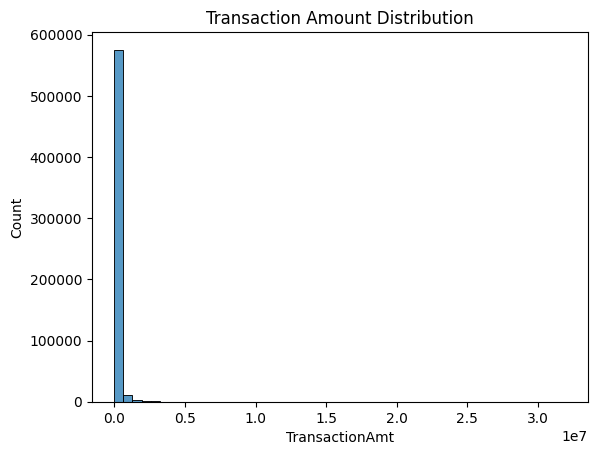

In [0]:
df_pd = fds_sdf.toPandas()
import seaborn as sns
import matplotlib.pyplot as plt

sns.histplot(df_pd["TransactionAmt"], bins=50)
plt.title("Transaction Amount Distribution")
plt.show()


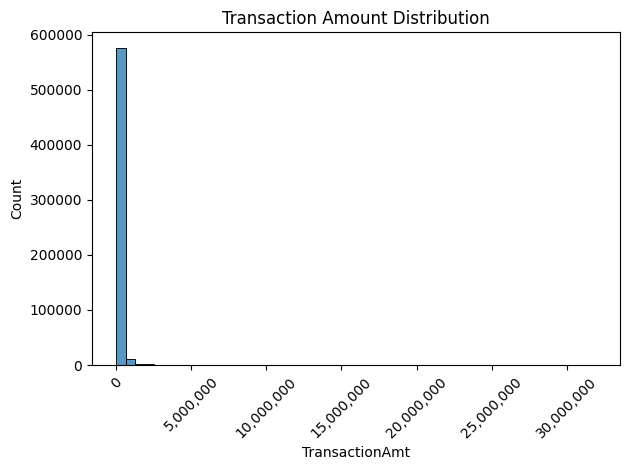

In [0]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

fds_pdf = fds_sdf.toPandas()
sns.histplot(fds_pdf["TransactionAmt"], bins=50)
plt.title("Transaction Amount Distribution")

plt.gca().xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f"{x:,.0f}"))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

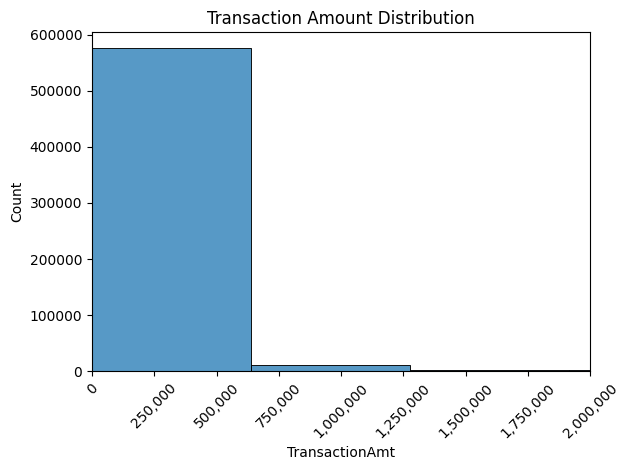

In [0]:
import matplotlib.ticker as ticker
import seaborn as sns
import matplotlib.pyplot as plt

sns.histplot(fds_pdf["TransactionAmt"], bins=50)
plt.title("Transaction Amount Distribution")

# X축 범위 지정
plt.xlim(0, 2000000)  # 범위: 0 ~ 2,000,000

# 콤마 포맷 적용
plt.gca().xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f"{x:,.0f}"))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


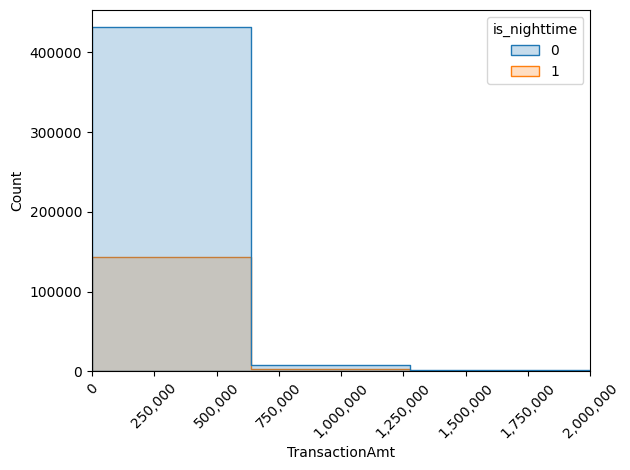

In [0]:
#야간 거래와 주간거래로 나누어 비교
sns.histplot(data=fds_pdf, x="TransactionAmt", hue="is_nighttime", bins=50, element="step")
plt.xlim(0, 2000000) 
plt.gca().xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f"{x:,.0f}"))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


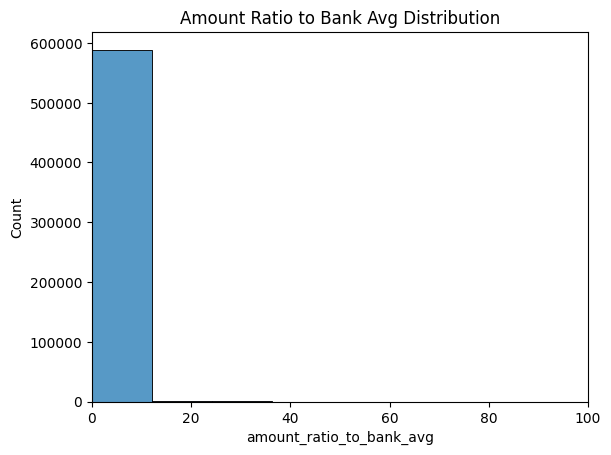

In [0]:
sns.histplot(fds_pdf["amount_ratio_to_bank_avg"], bins=50)
plt.title("Amount Ratio to Bank Avg Distribution")
plt.xlim(0, 100)
plt.show()


In [0]:
fds_pdf["amount_ratio_to_bank_avg"]

0         0.142229
1         0.362758
2         0.270291
3         0.109316
4         0.172746
            ...   
590535    0.186128
590536    0.102372
590537    0.069969
590538    0.571261
590539    4.190304
Name: amount_ratio_to_bank_avg, Length: 590540, dtype: float64

In [0]:
fds_pdf["amount_ratio_to_bank_avg"] * 100

0          14.222949
1          36.275847
2          27.029132
3          10.931590
4          17.274558
             ...    
590535     18.612778
590536     10.237245
590537      6.996864
590538     57.126117
590539    419.030370
Name: amount_ratio_to_bank_avg, Length: 590540, dtype: float64

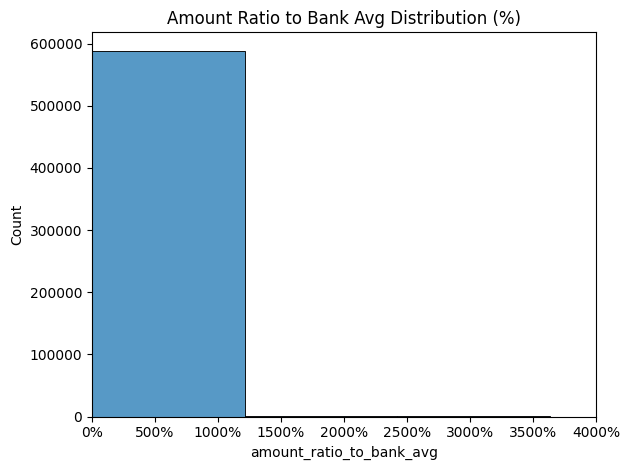

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as ticker

# 비율을 %로 바꿔서 시각화
sns.histplot(fds_pdf["amount_ratio_to_bank_avg"] * 100, bins=50)
plt.title("Amount Ratio to Bank Avg Distribution (%)")

# X축 범위 (선택)
plt.xlim(0, 4000)

# 콤마 대신 퍼센트 기호 표시
plt.gca().xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f"{x:.0f}%"))

plt.tight_layout()
plt.show()


In [0]:
# 고비율 거래 필터링 (200% 초과)
high_ratio_df = fds_pdf[fds_pdf['amount_ratio_to_bank_avg'] > 2.0]
print(f"Filtered 거래 수: {len(high_ratio_df)}")

Filtered 거래 수: 37191


/root/.ipykernel/1155/command-8396190647303783-1572064942:15: UserWarning: Glyph 44256 (\N{HANGUL SYLLABLE GO}) missing from current font.
  plt.tight_layout()
/root/.ipykernel/1155/command-8396190647303783-1572064942:15: UserWarning: Glyph 48708 (\N{HANGUL SYLLABLE BI}) missing from current font.
  plt.tight_layout()
/root/.ipykernel/1155/command-8396190647303783-1572064942:15: UserWarning: Glyph 50984 (\N{HANGUL SYLLABLE YUL}) missing from current font.
  plt.tight_layout()
/root/.ipykernel/1155/command-8396190647303783-1572064942:15: UserWarning: Glyph 44144 (\N{HANGUL SYLLABLE GEO}) missing from current font.
  plt.tight_layout()
/root/.ipykernel/1155/command-8396190647303783-1572064942:15: UserWarning: Glyph 47000 (\N{HANGUL SYLLABLE RAE}) missing from current font.
  plt.tight_layout()
/root/.ipykernel/1155/command-8396190647303783-1572064942:15: UserWarning: Glyph 51032 (\N{HANGUL SYLLABLE YI}) missing from current font.
  plt.tight_layout()
/root/.ipykernel/1155/command-8396190

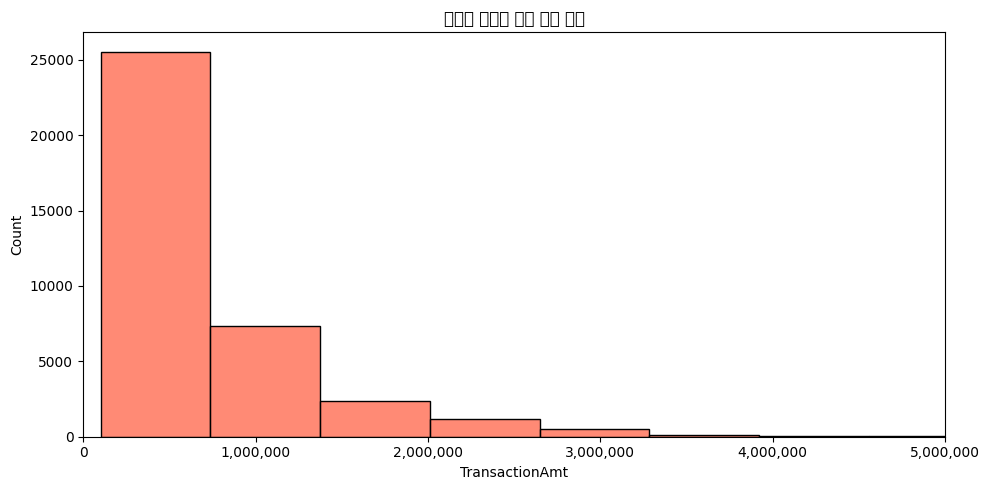

In [0]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

plt.figure(figsize=(10, 5))
sns.histplot(high_ratio_df['TransactionAmt'], bins=50, color='tomato')
plt.title("고비율 거래의 거래 금액 분포")
plt.xlabel("TransactionAmt")
plt.ylabel("Count")

plt.xlim(0, 5000000)

# 콤마 포맷
plt.gca().xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f"{x:,.0f}"))
plt.tight_layout()
plt.show()


In [0]:
!apt-get update -y
!apt-get install -y fonts-nanum
!fc-cache -fv
!rm ~/.cache/matplotlib -rf


Hit:1 https://repos.azul.com/zulu/deb stable InRelease
Hit:2 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:3 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:4 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:5 http://archive.ubuntu.com/ubuntu jammy-backports InRelease

W: https://repos.azul.com/zulu/deb/dists/stable/InRelease: Key is stored in legacy trusted.gpg keyring (/etc/apt/trusted.gpg), see the DEPRECATION section in apt-key(8) for details.



fonts-nanum is already the newest version (20200506-1).
0 upgraded, 0 newly installed, 0 to remove and 53 not upgraded.
/usr/share/fonts: caching, new cache contents: 0 fonts, 2 dirs
/usr/share/fonts/X11: caching, new cache contents: 0 fonts, 3 dirs
/usr/share/fonts/X11/encodings: caching, new cache contents: 0 fonts, 1 dirs
/usr/share/fonts/X11/encodings/large: caching, new cache contents: 0 fonts, 0 dirs
/usr/share/fonts/X11/misc: caching, new cache contents: 89 fonts, 0 dirs
/usr/share/fonts/X11/util: c

In [0]:
import matplotlib.font_manager as fm

# 설치된 나눔 폰트 중 하나 경로 확인
font_list = [f for f in fm.findSystemFonts(fontpaths=None) if 'NanumGothic' in f]
print(font_list)


['/usr/share/fonts/truetype/nanum/NanumGothicBold.ttf', '/usr/share/fonts/truetype/nanum/NanumGothicCodingBold.ttf', '/usr/share/fonts/truetype/nanum/NanumGothic.ttf', '/usr/share/fonts/truetype/nanum/NanumGothicCoding.ttf']


In [0]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import matplotlib

# 설치된 폰트 경로
font_path = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf'

# FontProperties 객체 생성
fontprop = fm.FontProperties(fname=font_path)

# 폰트 이름 가져오기
font_name = fontprop.get_name()
print("설정된 폰트 이름:", font_name)

# matplotlib에 한글 폰트 전역 설정
plt.rcParams['font.family'] = font_name
plt.rcParams['axes.unicode_minus'] = False


설정된 폰트 이름: NanumGothic


In [0]:
from matplotlib import rcParams
print("📌 현재 폰트:", rcParams['font.family'])


📌 현재 폰트: ['NanumGothic']


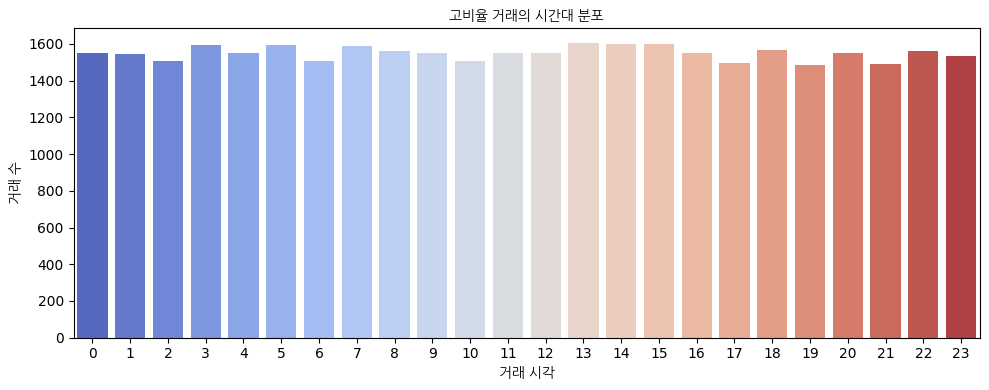

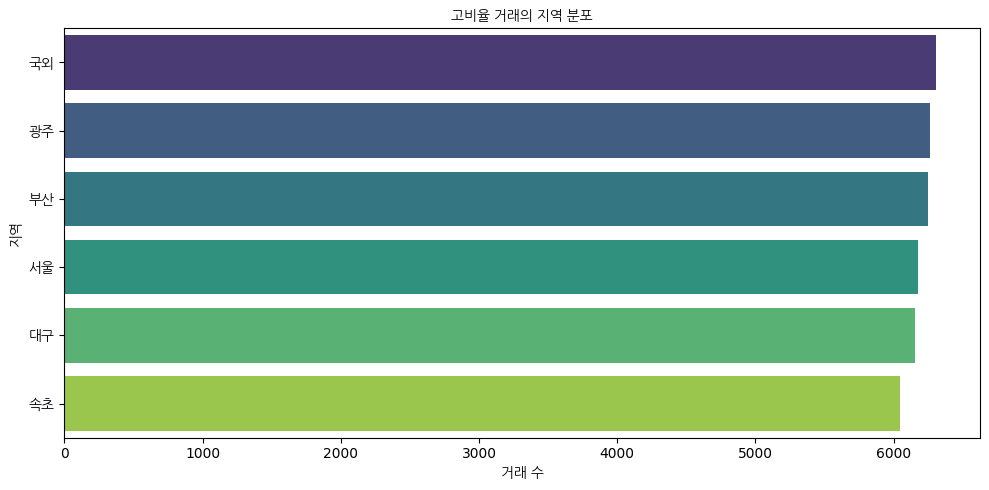

In [0]:
from matplotlib import pyplot as plt
import seaborn as sns
from matplotlib.font_manager import FontProperties

font_path = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf'
fontprop = FontProperties(fname=font_path)

# 시간대 분포
plt.figure(figsize=(10, 4))
sns.countplot(x='hour', data=high_ratio_df, palette='coolwarm')
plt.title("고비율 거래의 시간대 분포", fontproperties=fontprop)
plt.xlabel("거래 시각", fontproperties=fontprop)
plt.ylabel("거래 수", fontproperties=fontprop)
plt.tight_layout()
plt.show()

# 지역별 분포
plt.figure(figsize=(10, 5))
sns.countplot(
    y='region',
    data=high_ratio_df,
    order=high_ratio_df['region'].value_counts().index,
    palette='viridis'
)

# 제목 및 축 레이블
plt.title("고비율 거래의 지역 분포", fontproperties=fontprop)
plt.xlabel("거래 수", fontproperties=fontprop)
plt.ylabel("지역", fontproperties=fontprop)

# y축에 표시되는 '지역명'에 한글 폰트 강제 적용
plt.yticks(fontproperties=fontprop)
plt.tight_layout()
plt.show()


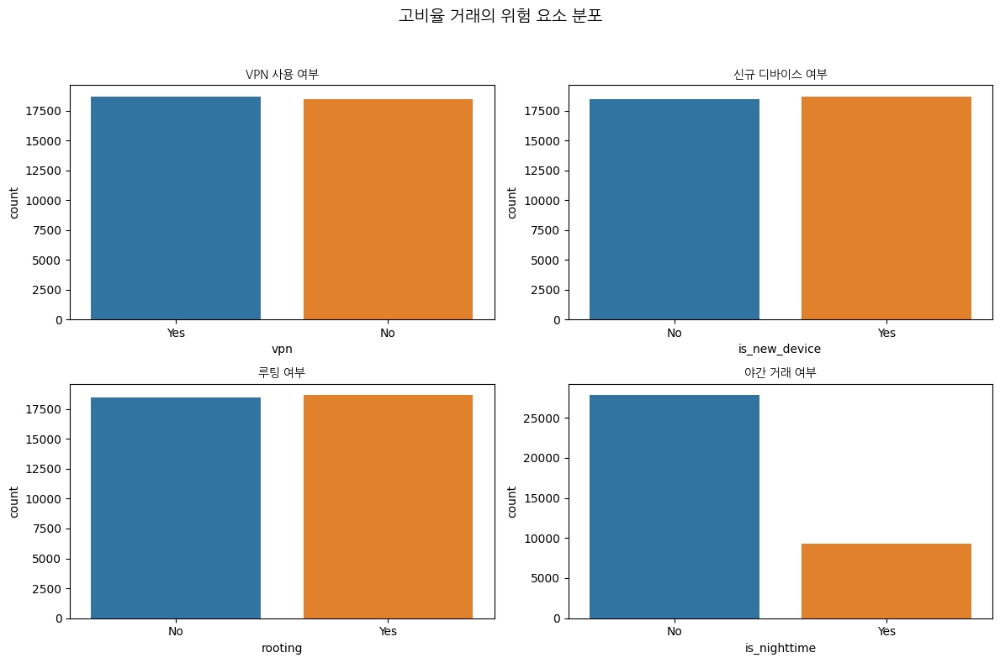

In [0]:
# 위험 변수 조합 시각화용: Boolean → String (True/False → 'Yes'/'No')
plot_df = high_ratio_df.copy()
plot_df['vpn'] = plot_df['vpn'].map({True: 'Yes', False: 'No'})
plot_df['is_new_device'] = plot_df['is_new_device'].map({True: 'Yes', False: 'No'})
plot_df['rooting'] = plot_df['rooting'].map({True: 'Yes', False: 'No'})
plot_df['is_nighttime'] = plot_df['is_nighttime'].map({1: 'Yes', 0: 'No'})

# 각 위험 지표별 분포
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
sns.countplot(ax=axes[0, 0], x='vpn', data=plot_df)
axes[0, 0].set_title("VPN 사용 여부", fontproperties=fontprop)

sns.countplot(ax=axes[0, 1], x='is_new_device', data=plot_df)
axes[0, 1].set_title("신규 디바이스 여부", fontproperties=fontprop)

sns.countplot(ax=axes[1, 0], x='rooting', data=plot_df)
axes[1, 0].set_title("루팅 여부", fontproperties=fontprop)

sns.countplot(ax=axes[1, 1], x='is_nighttime', data=plot_df)
axes[1, 1].set_title("야간 거래 여부", fontproperties=fontprop)

plt.suptitle("고비율 거래의 위험 요소 분포", fontsize=14, fontproperties=fontprop)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


시간 기반 분석

In [0]:
%sql
-- 시간대별 거래수
SELECT hour, 
       COUNT(*) AS cnt
FROM fds_data
GROUP BY hour
ORDER BY hour

hour,cnt
0,24741
1,24661
2,24605
3,24606
4,24444
5,24551
6,24573
7,24715
8,24613
9,24816


In [0]:
%sql
-- 야간 거래 여부에 따른 거래 수
SELECT is_nighttime,
       COUNT(*) AS cnt
FROM fds_data
GROUP BY is_nighttime

is_nighttime,cnt
1,147608
0,442932


의심 패턴 조합 탐색

In [0]:
%sql
-- vpn + rooting + is_new_device 조합 빈도
SELECT vpn,
       rooting,
       is_new_device,
       COUNT(*) AS cnt
FROM fds_data
GROUP BY vpn, rooting, is_new_device
ORDER BY cnt DESC

vpn,rooting,is_new_device,cnt
false,false,false,74037
false,false,true,73965
false,true,true,73904
true,false,true,73860
true,true,true,73731
false,true,false,73700
true,true,false,73686
true,false,false,73657


In [0]:
%sql
-- 거래 간격이 5분 이하인 거래
SELECT COUNT(*) AS rapid_repeat_tx
FROM fds_data
WHERE recent_transaction_gap < 5

rapid_repeat_tx
47407
